In [1]:
!nvidia-smi

Thu Dec  8 08:03:33 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.27.04    Driver Version: 460.27.04    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  GeForce RTX 208...  Off  | 00000000:3B:00.0 Off |                  N/A |
| 30%   29C    P8     4W / 250W |   7897MiB / 11019MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
|   1  GeForce RTX 208...  Off  | 00000000:5E:00.0 Off |                  N/A |
| 30%   

In [2]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

In [3]:
# import needed libraries
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Dropout
from sklearn import svm
from sklearn.linear_model import LogisticRegression
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix

In [4]:
sign_data_set = pd.read_csv("model-sign-dataset_cleaned_.csv")

In [5]:
sign_data_set

,Breathing Problem,Fever,Dry Cough,Sore throat,Running Nose,Asthma,Chronic Lung Disease,Headache,Heart Disease,Diabetes,Hyper Tension,Fatigue,Gastrointestinal,Abroad travel,Contact with COVID Patient,Attended Large Gathering,Visited Public Exposed Places,Family working in Public Exposed Places,Wearing Masks,COVID-19
0,1,1,1,1,1,0,0,0,0,1,1,1,1,0,1,0,1,1,0,Yes
1,1,1,1,1,0,1,1,1,0,0,0,1,0,0,0,1,1,0,0,Yes
2,1,1,1,1,1,1,1,1,0,1,0,1,1,1,0,0,0,0,0,Yes
3,1,1,1,0,0,1,0,0,1,1,0,0,0,1,0,1,1,0,0,Yes
4,1,1,1,1,1,0,1,1,1,1,1,0,1,0,1,0,1,0,0,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5429,1,1,0,1,1,1,1,0,0,0,0,1,1,0,0,0,0,0,0,Yes
5430,1,1,1,0,1,1,0,1,0,1,1,1,0,0,0,0,0,0,0,Yes
5431,1,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,No
5432,1,1,1,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,No


In [6]:
sign_data_set.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5434 entries, 0 to 5433
Data columns (total 20 columns):
 #   Column                                   Non-Null Count  Dtype 
---  ------                                   --------------  ----- 
 0   Breathing Problem                        5434 non-null   int64 
 1   Fever                                    5434 non-null   int64 
 2   Dry Cough                                5434 non-null   int64 
 3   Sore throat                              5434 non-null   int64 
 4   Running Nose                             5434 non-null   int64 
 5   Asthma                                   5434 non-null   int64 
 6   Chronic Lung Disease                     5434 non-null   int64 
 7   Headache                                 5434 non-null   int64 
 8   Heart Disease                            5434 non-null   int64 
 9   Diabetes                                 5434 non-null   int64 
 10  Hyper Tension                            5434 non-null   int

In [7]:
# Extract Independet variables
sign_x = sign_data_set.iloc[:, :-1].values

# Extract the Dependet variable
sign_y = sign_data_set['COVID-19'].values

# Incode the ouput data (dependent variable)
labelencoder_y= LabelEncoder()
sign_y = labelencoder_y.fit_transform(sign_y) 

In [8]:
sign_y

array([1, 1, 1, ..., 0, 0, 0])

In [9]:
# split the dataset into traning and validation sets
sign_Xtrain, sign_Xtest, sign_Ytrain, sign_Ytest= train_test_split(sign_x, sign_y, test_size= 0.15)

In [10]:
# convert input datasets of traning and testing to float32 for numpy operations
sign_Xtrain, sign_Xtest = np.array(sign_Xtrain, np.float32), np.array(sign_Xtest, np.float32)

In [11]:
sign_Xtrain.shape

(4618, 19)

# XGBoost Clissifier / SHAP

In [12]:
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, accuracy_score

XGBC = XGBClassifier(random_state=101)
XGBC.fit(sign_Xtrain,sign_Ytrain)

XGBC_prediction_train = XGBC.predict(sign_Xtrain)
XGBC_prediction_test  = XGBC.predict(sign_Xtest)
print()
print("Train Accurecy Score - " + str(accuracy_score(sign_Ytrain,XGBC_prediction_train)))
print(classification_report(sign_Ytrain,XGBC_prediction_train))
print()
print("Test Accurecy Score - " + str(accuracy_score(sign_Ytest,XGBC_prediction_test)))
print(classification_report(sign_Ytest,XGBC_prediction_test))
print()


/opt/conda/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[08:03:38] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

Train Accurecy Score - 0.9826764833261152
              precision    recall  f1-score   support

           0       0.93      0.98      0.96       885
           1       0.99      0.98      0.99      3733

    accuracy                           0.98      4618
   macro avg       0.96      0.98      0.97      4618
weighted avg       0.98      0.98      0.98      4618


Test Accurecy Score - 0.9828431372549019
              precision    recall  f1-score   support

           0       0.94      0.98      0.96       166
           1       1.00      0.98      0.99       650

    accuracy                           0.98       816
   macro avg       0.97      0.98      0.97       816
weighted avg       0.98      0.98      0.98       816




In [13]:
# n_features = sign_Xtrain.shape[1]

# # define model
# model_sign = Sequential()
# model_sign.add(Dense(15, activation='relu', kernel_initializer='he_normal', input_shape=(n_features,)))
# model_sign.add(Dense(25, activation='relu', kernel_initializer='he_normal'))
# model_sign.add(Dropout(0.4))
# model_sign.add(Dense(10, activation='relu', kernel_initializer='he_normal'))
# model_sign.add(Dense(1, activation='sigmoid'))

# # compile the model
# model_sign.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
# # configure early stopping (show graph of the impact of early stop)
# early_stop = EarlyStopping(monitor='val_loss', patience=5)
# # fit the model
# model_history = model_sign.fit(tf.expand_dims(sign_Xtrain, axis=-1), sign_Ytrain, epochs=10, batch_size=32, verbose=1, validation_split=0.2, callbacks=[early_stop])
# # model_history = model_sign.fit(sign_Xtrain, sign_Ytrain, epochs=150, batch_size=32, validation_split=0.2)

In [14]:
# model_sign.summary()

In [15]:
# # evaluate the model
# model_loss, model_acc = model_sign.evaluate(sign_Xtest, sign_Ytest, verbose=0)
# print("MLP model %s Accuracy = %.4f" % (1, model_acc))

In [16]:
import shap
# compute SHAP values
XGBC_explainer = shap.TreeExplainer(XGBC, sign_x)

In [17]:
XGBC_shap_values = XGBC_explainer.shap_values(sign_x,check_additivity=True)

 98%|===================| 5315/5434 [00:15<00:00]        

In [18]:
XGBC_dfShap = pd.DataFrame(XGBC_shap_values,columns=sign_data_set.iloc[:, :-1].columns,index=sign_data_set.index)

XGBC_dfShap_temp = XGBC_dfShap[:].copy()

In [19]:
XGBC_dfShap_temp

,Breathing Problem,Fever,Dry Cough,Sore throat,Running Nose,Asthma,Chronic Lung Disease,Headache,Heart Disease,Diabetes,Hyper Tension,Fatigue,Gastrointestinal,Abroad travel,Contact with COVID Patient,Attended Large Gathering,Visited Public Exposed Places,Family working in Public Exposed Places,Wearing Masks
0,0.923506,0.677200,0.726901,0.684565,-0.202626,0.272359,-0.084386,0.032513,0.428238,0.248863,-0.099486,-0.066858,0.077817,-0.949192,0.969476,-1.204640,-0.120857,1.118713,0.0
1,1.147294,0.666592,0.549751,0.501960,0.478039,0.043349,-0.015044,-0.033355,0.266959,-0.075991,0.174864,-0.071126,-0.135062,-0.592835,-0.325541,2.150141,0.051589,-0.192530,0.0
2,0.887720,0.546518,0.620866,0.431166,-0.302400,-0.055046,0.080865,-0.014425,0.200845,0.117436,0.087334,-0.058379,0.176981,2.761789,-0.114100,-0.899000,0.105553,-0.510315,0.0
3,0.780333,0.312439,0.435819,-0.945992,0.227657,0.033560,0.057839,-0.060439,-0.177022,0.155647,0.084934,0.032170,-0.178107,1.918787,-0.406256,1.675042,-0.084426,-0.159483,0.0
4,0.591268,0.440820,0.505888,0.636062,-0.330247,0.229082,0.220712,0.018275,-0.353459,0.252423,-0.230477,0.186013,0.133061,-1.191867,1.331598,-1.681143,0.253080,-0.494378,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5429,1.696058,0.475155,-2.853605,0.654260,-0.764485,0.024301,0.186640,-0.074101,0.038692,-0.017950,0.135085,-0.368412,0.073893,-2.011631,-0.645375,-2.218724,-0.065658,-0.995353,0.0
5430,1.567133,0.552774,0.717743,-1.927779,-0.625220,-0.106306,-0.070803,-0.235324,0.224705,0.130554,-0.237108,-0.041661,-0.488013,-2.126323,-0.820899,-2.513655,-0.082799,-0.748286,0.0
5431,1.342155,0.611284,0.583266,-1.982758,0.424088,0.019494,0.088708,-0.207103,-0.677623,-0.086175,-0.174544,-0.008368,-0.570086,-2.119854,-0.880734,-2.460808,0.132229,-0.548398,0.0
5432,1.363104,0.677583,0.616654,-1.909904,-0.433111,0.075709,0.017159,0.053954,-0.251306,-0.106518,0.140436,0.002925,-0.648588,-2.148808,-0.890737,-2.610322,0.054074,-0.628606,0.0


In [20]:
# TOTAL XGBC FORCE PLOT
shap.initjs()
shap.force_plot(XGBC_explainer.expected_value, XGBC_shap_values[:100], sign_x[:100])

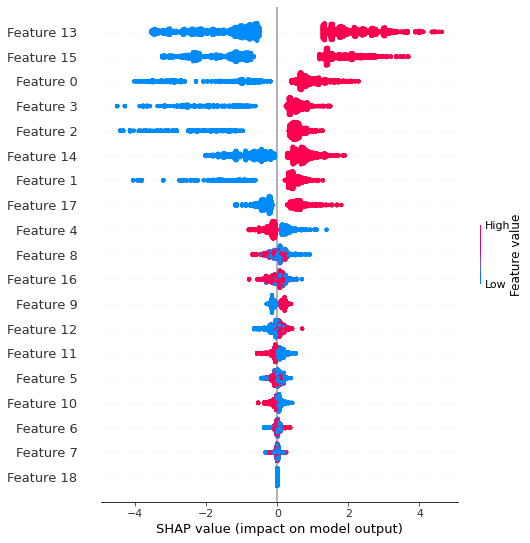

In [21]:
shap.initjs()
shap.summary_plot(XGBC_shap_values, sign_x)

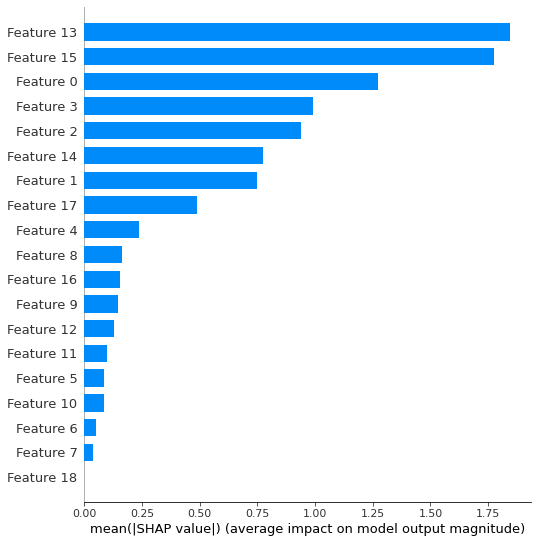

In [22]:
shap.initjs()
shap.summary_plot(XGBC_shap_values, sign_x, plot_type='bar')

# SVM Clissifier / SHAP

In [23]:
# Use support vector classification
SVC = svm.SVC(probability=True)
# Use the train data to train this classifier
SVC.fit(sign_Xtrain, sign_Ytrain)
# Use the trained model to predict on the test data
SVC_prediction_train = SVC.predict(sign_Xtrain)
SVC_prediction_test = SVC.predict(sign_Xtest)
# score = accuracy_score(sign_Ytest, predictions)

In [24]:
print()
print("Train Accurecy Score - " + str(accuracy_score(sign_Ytrain,SVC_prediction_train)))
print(classification_report(sign_Ytrain,SVC_prediction_train))
print()
print("Test Accurecy Score - " + str(accuracy_score(sign_Ytest,SVC_prediction_test)))
print(classification_report(sign_Ytest,SVC_prediction_test))
print()


Train Accurecy Score - 0.9824599393676916
              precision    recall  f1-score   support

           0       0.95      0.96      0.95       885
           1       0.99      0.99      0.99      3733

    accuracy                           0.98      4618
   macro avg       0.97      0.97      0.97      4618
weighted avg       0.98      0.98      0.98      4618


Test Accurecy Score - 0.9840686274509803
              precision    recall  f1-score   support

           0       0.95      0.97      0.96       166
           1       0.99      0.99      0.99       650

    accuracy                           0.98       816
   macro avg       0.97      0.98      0.98       816
weighted avg       0.98      0.98      0.98       816




In [28]:
SVC_explainer = shap.KernelExplainer(SVC.predict_proba,sign_x, link='logit')
SVC_shap_values = SVC_explainer.shap_values(sign_x, nsamples=100)

Using 5434 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/5434 [00:00<?, ?it/s]

In [29]:
# SVC_explainer2 = shap.KernelExplainer(SVC.predict,sign_x[:10], link='logit')
# SVC_shap_values2 = SVC_explainer.shap_values(sign_x[:10], nsamples=100)

In [30]:
# SVC_shap_values2

In [31]:
# SVC_shap_values

In [32]:
# SVC_shap_values[0]

In [33]:
# SVC_shap_values[1]

In [34]:
# SVC_dfShap = pd.DataFrame(SVC_shap_values,columns=sign_data_set.iloc[:, :-1].columns,index=sign_data_set.index)

# SVC_dfShap_temp = SVC_dfShap[:].copy()

In [35]:
# SVC_dfShap_temp

In [36]:
# 0 label TOTAL SVC FORCE PLOT
shap.initjs()
shap.force_plot(SVC_explainer.expected_value[0], SVC_shap_values[0], sign_x)

shap.plots.force is slow for many thousands of rows, try subsampling your data.


In [37]:
# 1 label TOTAL ISO_SCORE FORCE PLOT
shap.initjs()
shap.force_plot(SVC_explainer.expected_value[1], SVC_shap_values[1], sign_x)

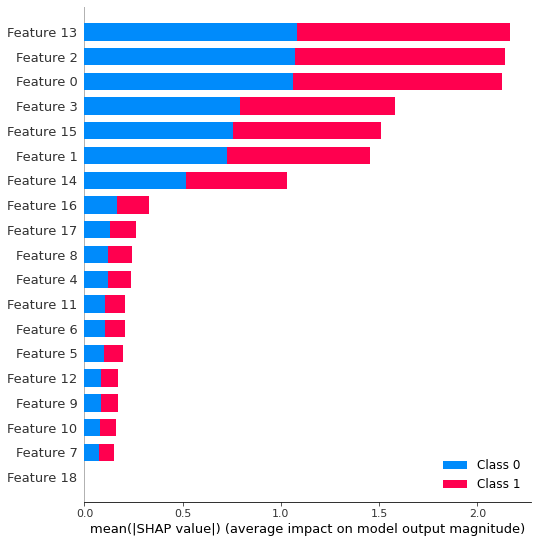

In [38]:
shap.initjs()
shap.summary_plot(SVC_shap_values, sign_x)

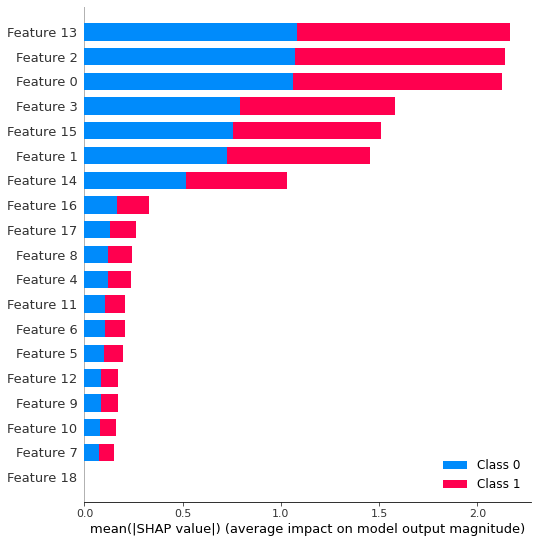

In [39]:
shap.initjs()
shap.summary_plot(SVC_shap_values, sign_x, plot_type='bar')

# Logistic Regression

In [25]:
from sklearn.linear_model import LogisticRegression

# all parameters of the model not specified are set to their defaults
lr = LogisticRegression()
# fit the model to the training data
lr.fit(sign_Xtrain, sign_Ytrain)


lr_prediction_train = lr.predict(sign_Xtrain)
lr_prediction_test = lr.predict(sign_Xtest)

# Use score method to get accuracy of model
# score = lr.score(sign_Xtest, sign_Ytest)


In [26]:
print()
print("Train Accurecy Score - " + str(accuracy_score(sign_Ytrain,lr_prediction_train)))
print(classification_report(sign_Ytrain,lr_prediction_train))
print()
print("Test Accurecy Score - " + str(accuracy_score(sign_Ytest,lr_prediction_test)))
print(classification_report(sign_Ytest,lr_prediction_test))
print()


Train Accurecy Score - 0.9705500216543959
              precision    recall  f1-score   support

           0       0.94      0.90      0.92       885
           1       0.98      0.99      0.98      3733

    accuracy                           0.97      4618
   macro avg       0.96      0.94      0.95      4618
weighted avg       0.97      0.97      0.97      4618


Test Accurecy Score - 0.9705882352941176
              precision    recall  f1-score   support

           0       0.94      0.91      0.93       166
           1       0.98      0.99      0.98       650

    accuracy                           0.97       816
   macro avg       0.96      0.95      0.95       816
weighted avg       0.97      0.97      0.97       816




In [27]:
print(lr.coef_)

[[ 2.39204998  2.95144569  2.87141627  2.72861479 -0.92402612 -0.05533345
  -0.16177709 -0.29968384 -0.11900757  0.39114067 -0.13387221 -0.21403835
   0.0627604   5.59104996  1.80659634  5.70514259 -0.1840752   1.04682417
   0.        ]]
